#Parcial 2 SyS
##Preguntas:
1- Sea el demodulador en amplitud presentado en la siguiente Figura:
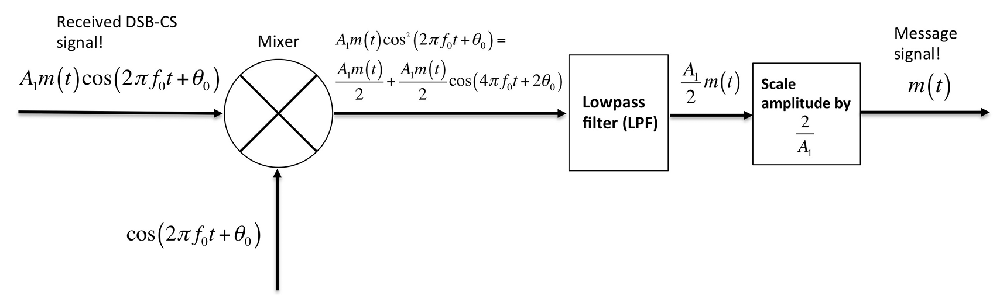

Asumiendo $θ_0=0$, determine el espectro de Fourier (teórico) en cada una de las etapas del sistema. Luego, con base en la simulación de amplitud del Taller 2 y utilizando 5 segundos de una canción de YouTube como mensaje, grafique cada una de las etapas principales del proceso de modulación y demodulación en el tiempo y la frecuencia (reproduzca el segmento de la canción en cada etapa).

Nota: Para la etapa de filtrado pasa bajas, realice su implementación a partir de la transformada rápida de Fourier.

###R=/
Lo primero que nos piden es determinar el espectro de Fourier en cada etapa del sistema asumiendo $θ_0=0$. Para esto definimos la *"Received DSB-CS signal!"* en Sympy:

In [1]:
import sympy as sp
t = sp.symbols('t',real=True) #definimos la variable t, el tiempo es una variable real
m = sp.Function('m')(t) #definimos el mensaje, una función que depende del tiempo
A1 = sp.symbols('A1', real=True) #definimos la amplitud, diremos que esta amplitud es también una variable real
f0 = sp.symbols('f0', real=True) #definimos la frecuencia, tambien es real
sign1 = A1*m*sp.cos(2*sp.pi*f0*t) #señal recibida DSB-CS, no ponemos la suma de theta ya que theta es igual a 0 en este caso
sign1

A1*m(t)*cos(2*pi*f0*t)

El espectro de Fourier por su parte se determina al aplicar la transformada de Fourier a la función. Esta se calcula por definición como:

$\begin {equation}
F\{x(t)\}=\int_{-∞}^∞ x(t) e^{-jωt} dt
\end {equation}$

Asi que definimos el euler complejo por Sympy:

In [2]:
omega = sp.symbols('omega', real=True)
eulercomp = sp.exp(-sp.I*omega*t) #sp.I es el imaginario de sympy para que no nos de errores
eulercomp

exp(-I*omega*t)

Y creamos la función transformada de Fourier:

In [3]:
def transfou (arg=sp.Function('x')(t)):
  fouespec = sp.integrate(arg*eulercomp, (t,-sp.oo,sp.oo)) #calcula el espectro
  return fouespec #lo devuelve

Ahora hacemos transformada de Fourier a nuestra *"Received DSB-CS signal!"*:

In [4]:
especsign1 = transfou(sign1)
especsign1

A1*Integral(m(t)*exp(-I*omega*t)*cos(2*pi*f0*t), (t, -oo, oo))

¿Que ha pasado? Sympy no puede hacer esa integral pues no conoce a $m(t)$, asi que lo haremos a mano.

Luego de hacer las transformadas de Fourier a mano, nos piden usar una canción de Youtube como mensaje graficar cada una de las etapas principales del proceso de modulación y demodulación en el tiempo y la frecuencia, para esto primero vamos a descargar una cancion:

In [5]:
!python3 -m pip install --force-reinstall https://github.com/yt-dlp/yt-dlp/archive/master.tar.gz
link="https://www.youtube.com/watch?v=v2H4l9RpkwM" #link de la canción de esta ocasión
!yt-dlp --cookies www.youtube.com_cookies.txt --extract-audio -o "cancion" --audio-format mp3 {link}

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 24.3 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for yt-dlp: filename=yt_dlp-2025.11.12-py3-none-any.whl size=3035792 sha256=5fe2b6603089c36733fdc3d1821fd9fd54dcc03c42a46a7b9301b94366fc433c
  Stored in directory: /tmp/pip-ephem-wheel-cache-e9m1yjql/wheels/2d/79/97/7209650ef73114e0fe0603480da012ad3afacb9cae6b8acd9a
Successfully built yt-dlp
[youtube] Extracting URL: https://www.youtube.com/watch?v=v2H4l9RpkwM
[youtube] v2H4l9RpkwM: Downloading webpage
[youtube] v2H4l9RpkwM: Downloading android sdkless player API JSON
[youtube] v2H4l9RpkwM: Downloading web safari player API JSON
[youtube] v2H4l9RpkwM: Downloading m3u8 information
[info] v2H4l9RpkwM: Downloading 1 format(s): 251
[download] Destination: cancion

[ExtractAudio] Destination: cancion.mp3
Deleting original file cancion (pass -k to keep)


In [6]:
!ffmpeg -y -i cancion.mp3 output.wav #convertimos a .wav pa procesar, obviamente le decimos que procese cancion que es el que descargamos

ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

In [7]:
!pip install soundfile
import soundfile as sf #soundfile para procesar canciones
nombre_out = "output.wav"
#x, fs = sf.read(nombre_out) #no me deja descargar la canción, asi que la subi yo mismo
x, fs = sf.read('/kaggle/input/output/output.wav') #si no deja descargar la cancion hay que hacer esto
# read speech signal from file
print('Frecuencia de muestreo %.2f[Hz]\ncancion %s' % (fs,nombre_out))

Frecuencia de muestreo 44100.00[Hz]
cancion output.wav


In [8]:
x.shape

(8739695, 2)

Intentemos reproducirla pa ver si si es:

In [9]:
from IPython.display import Audio
ns = 30 #se reproducen los primeros ns segundos
Audio(x[:int(fs*ns),:].T,rate=fs)

Ya tenemos nuestro mensaje $m(t)$ que en python nombramos como $x$, ahora vamos a decidir los valores de $A_1$ y $f_0$.

Según el ejemplo de modulación AM, y según he consultado $A_1$ es la amplitud del canal, en esta ocasión por simpleza elegimos:

$A_1=1$

Sin embargo $f_0$ no se puede elegir tan libremente, ya que es la frecuencia de la portadora, y lo normal es que la frecuencia de la portadora sea mucho mayor que la del mensaje. En el ejemplo de modulación AM se uso como frecuencia del mensaje $10Hz$ y como frecuencia de la portadora $100Hz$, asi que tomando inspiración de ese ejemplo usaremos una portadora 10 veces mayor, es decir de $480kHz$

In [10]:
import matplotlib.pyplot as plt
import numpy as np
Fc = 480000 #frecuencia de portadora
ti = 0
Fmuestreo = 5*Fc #frecuencia de muestreo
tf = 5 #para que grafique 5 segundos
t = np.arange(ti,tf,1/Fmuestreo) #vector del tiempo

Ahora bien, tanto para multiplicar como para graficar nos vamos a encontrar con un problema en este caso: los tamaños, y es que mientras el vector de tiempo de la portadora esta hecho para una frecuencia de 10 veces $480kHz$ con el fin de cumplir Nyquist al graficar, la canción descargada esta apenas sampleada a $48kHz$ o $44,1kHz$, para solucionar esto nos vemos en la necesidad de resamplear, haciendo uso de:

In [11]:
from scipy.io import wavfile
from scipy.signal import resample_poly
#fs, audio = wavfile.read("output.wav") #kaggle no me dejo descargar la cancion, la subi a mano
fs, audio = wavfile.read("/kaggle/input/output/output.wav")

In [12]:
# Asegurar que sea float
audio = audio.astype(float)
fs_new = Fmuestreo  # nueva frecuencia
g = np.gcd(int(fs_new), int(fs))  # máximo común divisor
up = fs_new // g
down = fs // g


In [13]:
audio_resampled = resample_poly(audio, up, down)

In [14]:
audio_resampled.shape

(475629660, 2)

Ahora "audio_resampled" esta listo para procesarse, asi que intentamos graficar tanto la portadora como el mensaje:

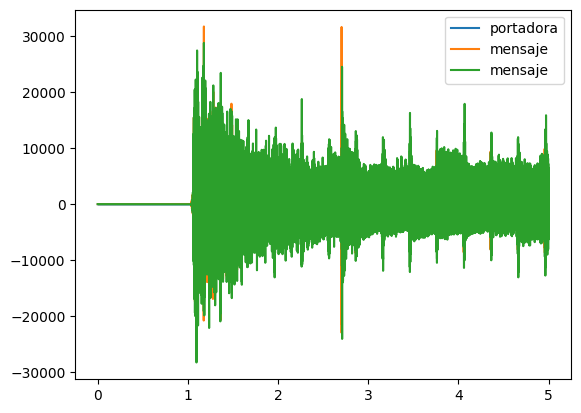

In [15]:
xpro = audio_resampled.copy() #copiar archivos para procesar
xs = xpro[int(ti):int(tf*Fmuestreo),:]
del audio_resampled
#xc1 = xs[:,0]
#xc2 = xs[:,1]
c = np.cos(2*np.pi*Fc*t)
plt.plot(t,c,label='portadora')
plt.plot(t,xs,label='mensaje')
#plt.plot(t,xc1,label='mensaje channel 1')
#plt.plot(t,xc2,label='mensaje channel 2')
plt.legend()
plt.show()

En esta gráfica no se ve mucho de la portadora, ya que la amplitud de esta con respecto a la de la canción es muy pequeña, asi que usaremos una amplitud mayor para poder visualizarla:

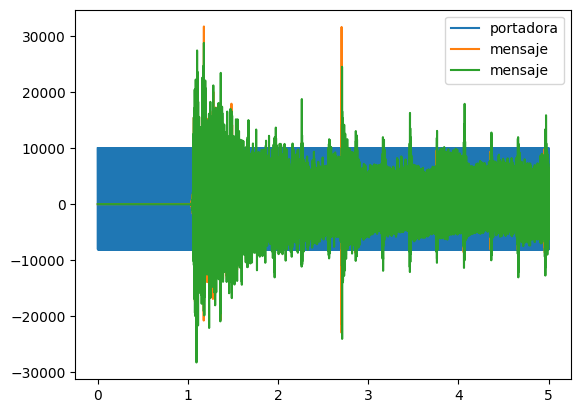

In [16]:
c = 10000*np.cos(2*np.pi*Fc*t)
plt.plot(t,c,label='portadora')
plt.plot(t,xs,label='mensaje')
plt.legend()
plt.show()

Asi ya graficamos en el tiempo, para graficar en la frecuencia debemos aplicar FFT:

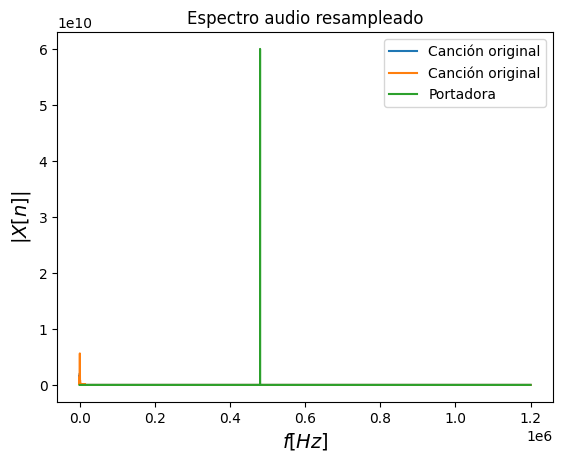

In [17]:
Xw = np.fft.rfft(xs,axis=0) # axis=0 permite aplicar fft por cada columna de xpro
vf = np.fft.rfftfreq(np.size(xs,0),1/Fmuestreo) #se crea el vector de frecuencias
cw = np.fft.rfft(c, axis=0)
vfc = np.fft.rfftfreq(np.size(c,0),1/Fmuestreo) #se crea el vector de frecuencias
plt.plot(vf,abs(Xw), label='Canción original')#se grafica la magnitud
plt.plot(vfc,abs(cw), label='Portadora')#se grafica la magnitud
plt.legend()
plt.title(r'Espectro audio resampleado')
plt.xlabel(r'$f[Hz]$',fontsize = 14)
plt.ylabel(r'$|X[n]|$',fontsize = 14)
plt.show()

Sabiendo que la gráfica del espectro de la canción original luce muy diferente, consulte por que la gráfica del espectro despues de resamplear la canción parece tan pequeña, y al parecer esto es normal, debido a que la canción a pesar de haber sido resampleada sigue teniendo frecuencia predominantes entre $0kHz$ y $48kHz$, lo que frente al resto del espectro luce muy pequeño, tambien el espectro de la portadora es mucho mayor ya que se trata solo de una onda con una frecuencia enorme.

Ahora vamos a crear con base a estas 2 señales la señal "received DSB-CS signal"

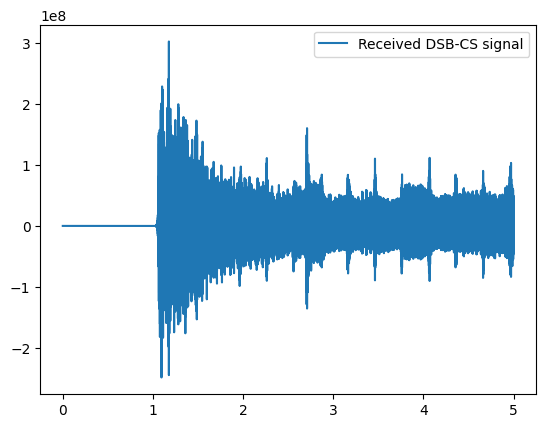

In [18]:
xs_mono = np.mean(xs, axis=1) #convertimos de stereo a mono para poder enviar el mensaje
#es la solución más simple, y la que usa AM tradicional
received = c*xs_mono
plt.plot(t,received,label='Received DSB-CS signal')
plt.legend()
plt.show()

En un principio parece que es la misma canción que al inicio, pero si la escuchamos:

In [19]:
received_resampled = resample_poly(received, down, up) #devolvemos a 48kHz o 44,1kHz para que nos permita
#escucharla, ya que a 480kHz sale error
ns = 5 #se reproducen los primeros ns segundos
Audio(received_resampled[:int(fs*ns)].T,rate=fs)

Es posible notar que se escucha muy similar, pero es diferente, y según estuve consultando, esto es aún más notorio al investigar su frecuencia:

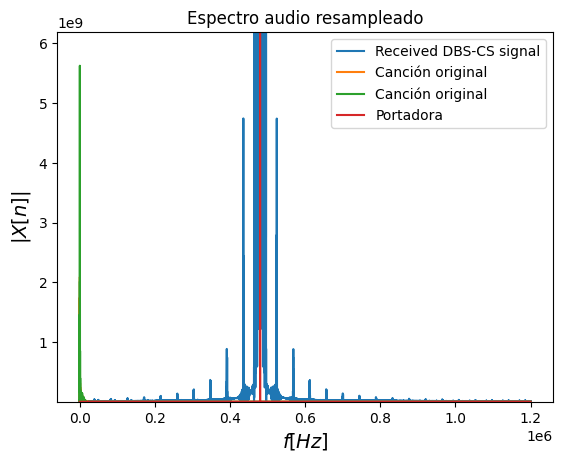

In [20]:
Xwr = np.fft.rfft(received,axis=0) # axis=0 permite aplicar fft por cada columna de xpro
vfr = np.fft.rfftfreq(np.size(received,0),1/Fmuestreo) #se crea el vector de frecuencias
plt.plot(vfr,abs(Xwr), label='Received DBS-CS signal')#se grafica la magnitud
plt.plot(vf,abs(Xw), label='Canción original')#se grafica la magnitud
plt.plot(vfc,abs(cw), label='Portadora')#se grafica la magnitud
plt.legend()
plt.title(r'Espectro audio resampleado')
plt.xlabel(r'$f[Hz]$',fontsize = 14)
plt.ylabel(r'$|X[n]|$',fontsize = 14)
plt.ylim([abs(Xw).min(), 1.1*abs(Xw).max()])
plt.show()

En este caso agregamos un limite a el eje y para que fuese más visible nuestro espectro. Tal como podemos apreciar si hay diferencia entre la canción original, la portadora y la "received DBS-CS signal". Ahora continuamos con la siguiente parte del proceso.

Luego de recibir esta señal, está pasa por el mixer y se convierte en:

$
\begin{equation}
A_1 m(t) cos^2 (2* \pi *f_0 *t)
\end{equation}
$

Vamos a simular ese proceso:

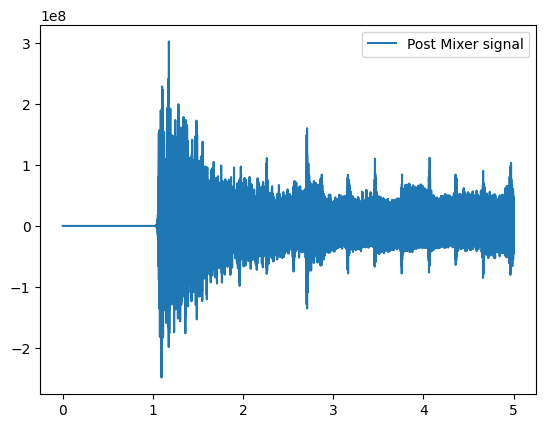

In [21]:
mixer = received * np.cos(2*np.pi*Fc*t)
plt.plot(t,mixer,label='Post Mixer signal')
plt.legend()
plt.show()

Lo cual luego de resamplear nuevamente a $48kHz$ se escucha:

In [22]:
mixer_resampled = resample_poly(mixer, down, up) #devolvemos a fs(48 o 44,1 kHz) para que nos permita
#escucharla, ya que a 480kHz sale error
ns = 5 #se reproducen los primeros ns segundos
Audio(mixer_resampled[:int(fs*ns)].T,rate=fs)

Nuevamente vamos a investigar su frecuencia para ver que pasa:

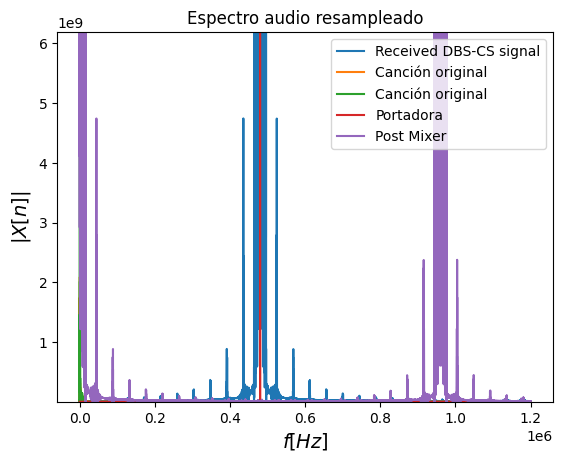

In [23]:
Xwmx = np.fft.rfft(mixer,axis=0) # axis=0 permite aplicar fft por cada columna de xpro
vfmx = np.fft.rfftfreq(np.size(mixer,0),1/Fmuestreo) #se crea el vector de frecuencias
plt.plot(vfr,abs(Xwr), label='Received DBS-CS signal')#se grafica la magnitud
plt.plot(vf,abs(Xw), label='Canción original')#se grafica la magnitud
plt.plot(vfc,abs(cw), label='Portadora')#se grafica la magnitud
plt.plot(vfmx,abs(Xwmx), label='Post Mixer')#se grafica la magnitud
plt.legend(loc='upper right') #a partir de aqui hay que especificar que coloque la leyenda en la parte
#superior derecha, ya que si no la muestra en el centro de la gráfica
plt.title(r'Espectro audio resampleado')
plt.xlabel(r'$f[Hz]$',fontsize = 14)
plt.ylabel(r'$|X[n]|$',fontsize = 14)
plt.ylim([abs(Xw).min(), 1.1*abs(Xw).max()])
plt.show()

En esta gráfica del espectroes posible ver que luego de pasar por el mixer quedan 2 espectros principales, si hicieramos la gráfica sin el valor absoluto posiblemente nos mostraria 3, ya que quedo el mensaje original, multiplicado por un escalar y sumado a una señal de una frecuencia aún mayor, lo que es:

$
\begin{equation}
\frac{A_1 m(t)}{2} + \frac{A_1 m(t)}{2}cos(4 \pi f_0 t)
\end{equation}
$

Ahora tenemos que implementar un filtro pasa bajas que solo deje pasar a nuestro mensaje multiplicado por un escalar $\frac{A_1}{2}$, para este fin reciclaremos un código usado durante el Taller 2:

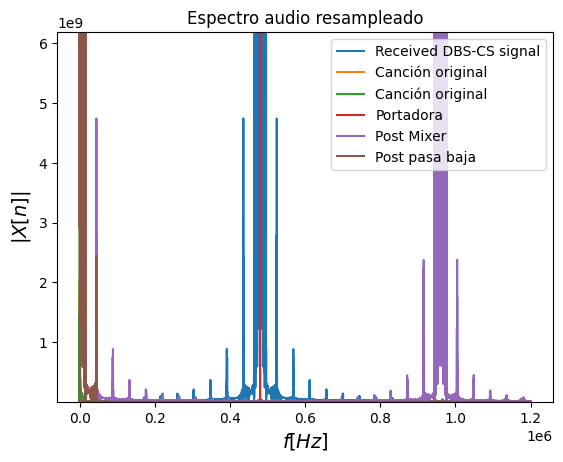

In [24]:
#filtrar espectro
Xwpb = Xwmx.copy() #copiamos el post mixer a un Xwpb
f1 = 0 #frecuencia en Hz corte 1 frecuencia min
f2 = fs #frecuencia en Hz corte 2 frecuencia max, coloque fs pues la canción original estaba
#a esa frecuencia antes de todo el proceso, y eso es visible en la linea verde que aún seguimos viendo
#El escalar no va a afectar a nuestra frecuencia
ind = ~((vf > f1) & (vf < f2)) #frecuencias eliminar-> recueder que ~ actua como negación
Xwpb[ind] = 0
plt.plot(vfr,abs(Xwr), label='Received DBS-CS signal')#se grafica la magnitud
plt.plot(vf,abs(Xw), label='Canción original')#se grafica la magnitud
plt.plot(vfc,abs(cw), label='Portadora')#se grafica la magnitud
plt.plot(vfmx,abs(Xwmx), label='Post Mixer')#se grafica la magnitud
plt.plot(vf,abs(Xwpb), label='Post pasa baja')
plt.legend(loc='upper right') 
plt.title(r'Espectro audio resampleado')
plt.xlabel(r'$f[Hz]$',fontsize = 14)
plt.ylabel(r'$|X[n]|$',fontsize = 14)
plt.ylim([abs(Xw).min(), 1.1*abs(Xw).max()])
plt.show()

Aqui nos es posible ver que luego del pasabajas solo queda la canción más una pequeña interferencia, ahora vamos a ver como luce y como se escucha al reconstruir con iFFT

In [25]:
xpb = np.fft.irfft(Xwpb,axis=0) #fft inversa
xpb_resampled = resample_poly(xpb, down, up) #devolvemos a fs(48 o 44,1 kHz) para que nos permita
#escucharla, ya que a 480kHz sale error
Audio(xpb_resampled[:int(fs*ns)].T,rate=fs)#reproducir señal filtrada y resampleada

Lo que gráficamente luce:

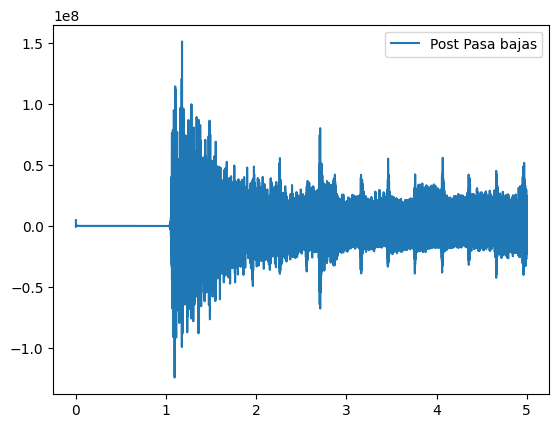

In [26]:
plt.plot(t,xpb,label='Post Pasa bajas')
plt.legend()
plt.show()

Esta es practicamente nuestra canción original, se supone que solo ha sido multiplicada por un escalar $\frac{A_1}{2}$, asi que volvemos pasamos a la etapa de *"Scale amplitude"*, donde multplicamos por $\frac{2}{A_1}$:

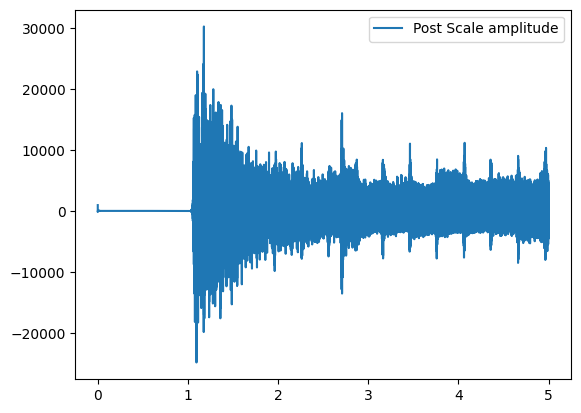

In [27]:
xsa = xpb*2/10000 #x scale amplitude es igual a x pasa bajas por 2 sobre la amplitud de la portadora
#la cual era de 10000
plt.plot(t,xsa,label='Post Scale amplitude')
plt.legend()
plt.show()

Si lo comparamos con la canción original, veremos que es el mismo mensaje inicial, con las mismas amplitudes, solo que en Mono y no en Stereo, si queremos lo podemos ver en el dominio de la frecuencia:

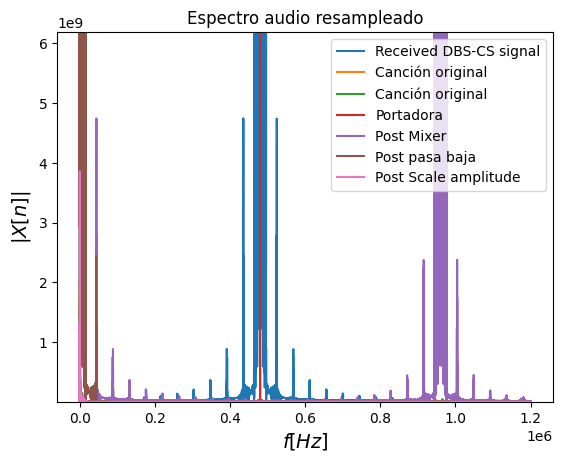

In [28]:
Xwsa = np.fft.rfft(xsa,axis=0) # axis=0 permite aplicar fft por cada columna de xpro
vfsa = np.fft.rfftfreq(np.size(xsa,0),1/Fmuestreo) #se crea el vector de frecuencias
plt.plot(vfr,abs(Xwr), label='Received DBS-CS signal')#se grafica la magnitud
plt.plot(vf,abs(Xw), label='Canción original')#se grafica la magnitud
plt.plot(vfc,abs(cw), label='Portadora')#se grafica la magnitud
plt.plot(vfmx,abs(Xwmx), label='Post Mixer')#se grafica la magnitud
plt.plot(vf,abs(Xwpb), label='Post pasa baja')
plt.plot(vfsa,abs(Xwsa), label='Post Scale amplitude')#se grafica la magnitud
plt.legend(loc='upper right') #a partir de aqui hay que especificar que coloque la leyenda en la parte
#superior derecha, ya que si no la muestra en el centro de la gráfica
plt.title(r'Espectro audio resampleado')
plt.xlabel(r'$f[Hz]$',fontsize = 14)
plt.ylabel(r'$|X[n]|$',fontsize = 14)
plt.ylim([abs(Xw).min(), 1.1*abs(Xw).max()])
plt.show()

Finalmente resampleamos otra vez y escuchamos devuelta nuestra canción original en mono:

In [29]:
xsa_resampled = resample_poly(xsa, down, up) #devolvemos a fs(48 o 44,1 kHz) para que nos permita
#escucharla, ya que a 480kHz sale error
Audio(xsa_resampled[:int(fs*ns)].T,rate=fs)#reproducir señal filtrada y resampleada